<a href="https://colab.research.google.com/github/EiEiChan/EC_UCIdataset/blob/main/INSE6220_Project_Multiclass_Classification_with_PyCaret.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Multiclass Classification with PyCaret**

Multiclass classification is a supervised machine learning technique where the goal is to classify instances into one of three or more classes. (Classifying instances into one of two classes is called Binary Classification).

**Install Pycaret**

In [ ]:
# install slim version (default): if you get an error message, run it again
!pip install pycaret==2.3.6

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'2.3.6'

**Import Libraries**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.5.3
Seaborn version:  0.12.2


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Dataset**

This classic dataset contains the prices and other attributes of almost 54,000 diamonds. 

The data set can be used for the tasks of classification and cluster analysis.


**Attribute Information:**

To construct the data, price and nine other characteristics of diamonds were measured:

1) Carat weight of the diamond (0.2--5.01)_(CA)

2) Cut quality of the cut (Fair, Good, Very Good, Premium, Ideal)_(CT)

3) Color diamond colour, from J (worst) to D (best)_(CO)

4) Clarity a measurement of how clear the diamond is (I1 (worst), SI2, SI1, VS2, VS1, VVS2, VVS1, IF (best))_(CL)

5) Depth total depth percentage = z / mean(x, y) = 2 * z / (x + y) (43--79)_(D)

6) Table width of top of diamond relative to widest point (43--95)_(T)

7) Price in US dollars (\$326--\$18,823)_(P) 

8) x length in mm (0--10.74)_(x)

9) y width in mm (0--58.9)_(y)

10) z depth in mm (0--31.8)_(z)

Three out of ten parameters were categorical and the remaining parameters were real-valued continuous.

https://www.kaggle.com/datasets/shivam2503/diamonds

In [ ]:
#read cvs file into dataframe
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/diamonds - Copy.csv')
df = df.rename (columns = {'carat':'CA', 'cut':'CT', 'color':'CO', 'clarity':'CL', 'depth':'D', 'table':'T', 'price':'P'})
df.head(25)

,CA,CT,CO,CL,D,T,P,x,y,z
0,0.75,Fair,D,SI2,64.6,57.0,2848,5.74,5.72,3.70
1,0.71,Fair,D,VS2,56.9,65.0,2858,5.89,5.84,3.34
2,0.90,Fair,D,SI2,66.9,57.0,2885,6.02,5.90,3.99
3,1.00,Fair,D,SI2,69.3,58.0,2974,5.96,5.87,4.10
4,1.01,Fair,D,SI2,64.6,56.0,3003,6.31,6.24,4.05
5,0.73,Fair,D,VS1,66.0,54.0,3047,5.56,5.66,3.70
6,0.71,Fair,D,VS2,64.7,58.0,3077,5.61,5.58,3.62
7,0.91,Fair,D,SI2,62.5,66.0,3079,6.08,6.01,3.78
8,0.90,Fair,D,SI2,65.9,59.0,3205,6.00,5.95,3.94
9,0.90,Fair,D,SI2,66.0,58.0,3205,6.00,5.97,3.95


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   CA      53940 non-null  float64
 1   CT      53940 non-null  object 
 2   CO      53940 non-null  object 
 3   CL      53940 non-null  object 
 4   D       53940 non-null  float64
 5   T       53940 non-null  float64
 6   P       53940 non-null  int64  
 7   x       53940 non-null  float64
 8   y       53940 non-null  float64
 9   z       53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


In [ ]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  146


In [ ]:
df1 = df.drop_duplicates(keep=False)

In [ ]:
print("Number of duplicated rows is: ", df1.duplicated().sum())

Number of duplicated rows is:  0


In [ ]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

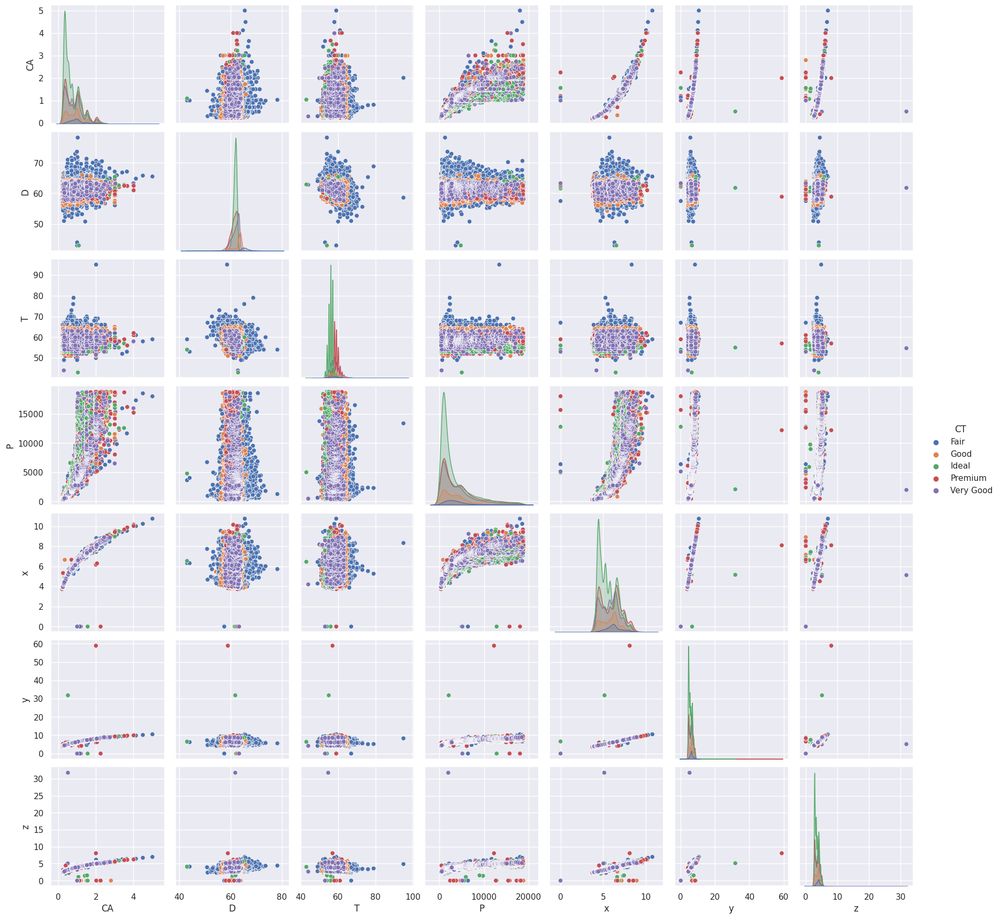

In [ ]:
sns.pairplot(df1, hue='CT')
plt.show()

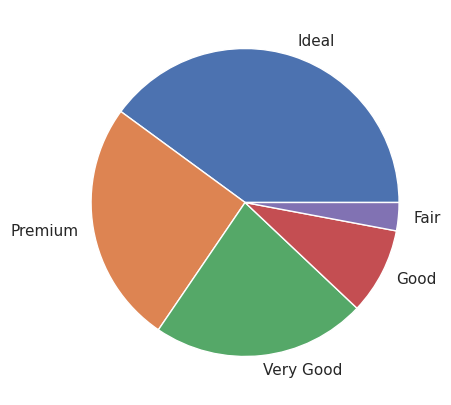

In [ ]:
y =df1['CT']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

In [ ]:
df1.shape

(53651, 10)

In [ ]:
df1['CT'].value_counts() / len(df1)
#res = df1.groupby('CT')
#print(res['CT'].value_counts())

Ideal        0.399396
Premium      0.255447
Very Good    0.224712
Good         0.090884
Fair         0.029561
Name: CT, dtype: float64

In [ ]:
nMax = 50
res = df1.groupby('CT').apply(lambda x: x.sample(n=min(nMax, len(x))))

print(res['CT'].value_counts())


Fair         50
Good         50
Ideal        50
Premium      50
Very Good    50
Name: CT, dtype: int64


In [ ]:
df2 = res.droplevel('CT')
df2.head(10)

,CA,CT,CO,CL,D,T,P,x,y,z
16729,1.51,Fair,F,SI1,65.8,56.0,8387,7.16,7.12,4.70
37509,1.20,Fair,H,SI2,64.8,60.0,4916,6.55,6.59,4.26
37671,0.70,Fair,H,SI1,61.0,66.0,1995,5.68,5.64,3.45
45881,0.83,Fair,I,VS2,64.9,58.0,2577,5.90,5.84,3.81
16739,1.50,Fair,F,SI1,64.6,60.0,11154,7.18,7.10,4.61
16822,0.62,Fair,F,SI1,55.1,66.0,1641,5.85,5.70,3.18
26247,2.50,Fair,G,I1,64.7,57.0,7854,8.48,8.44,5.47
16629,1.00,Fair,F,SI2,65.5,54.0,3864,6.20,6.16,4.05
37539,1.51,Fair,H,SI2,64.5,59.0,6291,7.21,7.15,4.63
6986,0.56,Fair,E,VVS2,57.3,60.0,2426,5.50,5.57,3.17


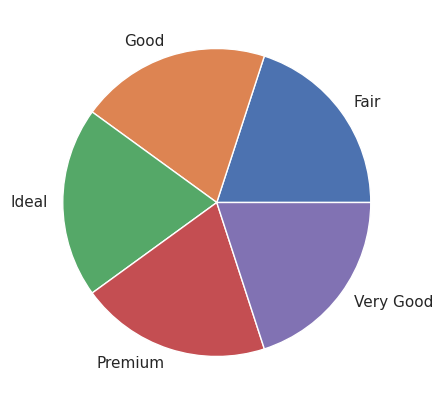

In [ ]:
y =df2['CT']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

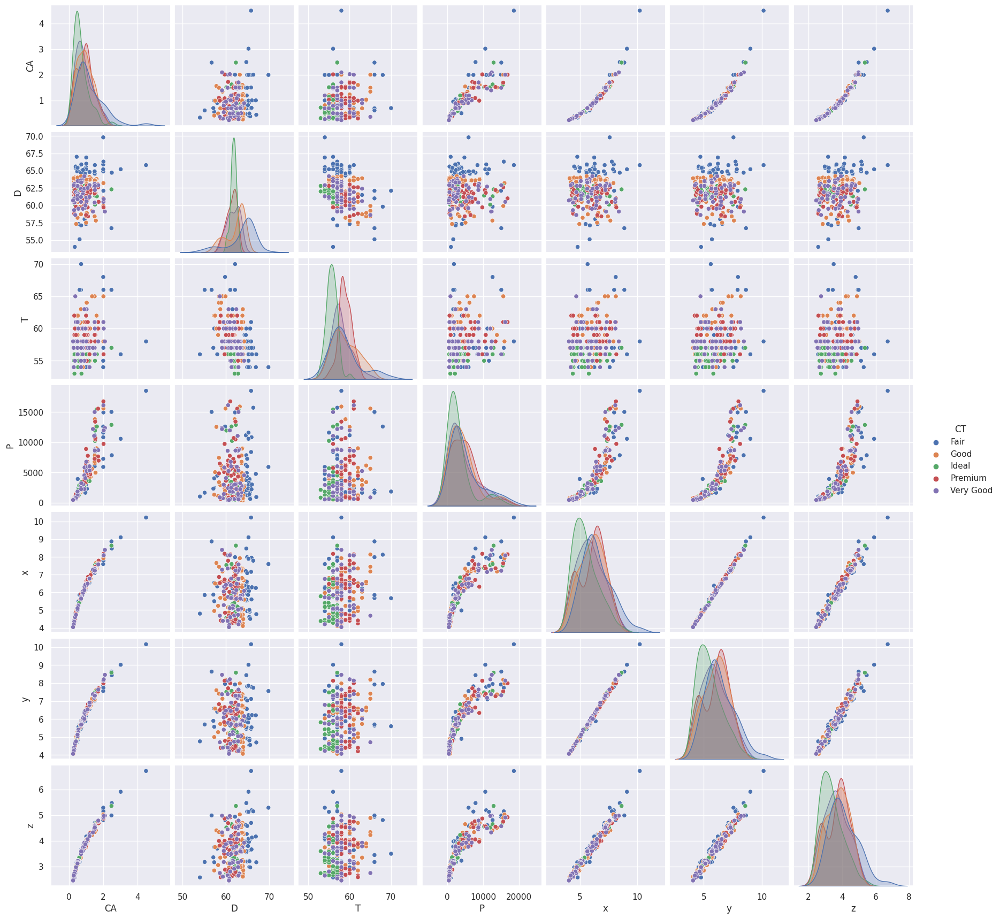

In [ ]:
sns.pairplot(df2, hue='CT')
plt.show()

**Data Matrix**

In [ ]:
X = df2.drop(columns=['CT','CL', 'CO'])
X.head(10)

,CA,D,T,P,x,y,z
16729,1.51,65.8,56.0,8387,7.16,7.12,4.70
37509,1.20,64.8,60.0,4916,6.55,6.59,4.26
37671,0.70,61.0,66.0,1995,5.68,5.64,3.45
45881,0.83,64.9,58.0,2577,5.90,5.84,3.81
16739,1.50,64.6,60.0,11154,7.18,7.10,4.61
16822,0.62,55.1,66.0,1641,5.85,5.70,3.18
26247,2.50,64.7,57.0,7854,8.48,8.44,5.47
16629,1.00,65.5,54.0,3864,6.20,6.16,4.05
37539,1.51,64.5,59.0,6291,7.21,7.15,4.63
6986,0.56,57.3,60.0,2426,5.50,5.57,3.17


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
CA,250.0,0.92720,0.569481,0.24,0.5000,0.820,1.2000,4.50
D,250.0,62.08440,2.161371,54.00,60.9000,62.100,63.6000,69.80
T,250.0,58.03520,2.820401,53.00,56.0000,58.000,60.0000,70.00
P,250.0,4349.65200,4008.061966,378.00,1335.5000,2912.000,5879.7500,18531.00
x,250.0,6.00012,1.168524,4.04,5.0425,5.985,6.7375,10.23
y,250.0,5.99080,1.152829,4.07,5.0700,5.960,6.6900,10.16
z,250.0,3.72368,0.741424,2.46,3.1700,3.720,4.2200,6.72


**Standardize the Data**

In [ ]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,CA,D,T,P,x,y,z
0,1.025441,1.722543,-0.723047,1.009327,0.994594,0.981468,1.319459
1,0.479994,1.258945,0.698036,0.141586,0.471521,0.520807,0.724816
2,-0.399760,-0.502725,2.829661,-0.588657,-0.274502,-0.304905,-0.369868
3,-0.171024,1.305305,-0.012506,-0.443159,-0.085853,-0.131071,0.116658
4,1.007846,1.166226,0.698036,1.701071,1.011744,0.964085,1.197828
5,-0.540521,-3.237950,2.829661,-0.677157,-0.128727,-0.252755,-0.734763
6,2.767353,1.212586,-0.367776,0.876079,2.126490,2.128774,2.360085
7,0.128092,1.583464,-1.433589,-0.121412,0.171397,0.147064,0.441009
8,1.025441,1.119866,0.342765,0.485332,1.037469,1.007543,1.224857
9,-0.646091,-2.218036,0.698036,-0.480908,-0.428851,-0.365747,-0.748277


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
CA,250.0,-1.421085e-17,1.002006,-1.209133,-0.751662,-0.188619,0.479994,6.286368
D,250.0,-2.842171e-17,1.002006,-3.747908,-0.549085,0.007232,0.702628,3.576933
T,250.0,2.842171e-17,1.002006,-1.788860,-0.723047,-0.012506,0.698036,4.250744
P,250.0,-1.065814e-17,1.002006,-0.992904,-0.753531,-0.359410,0.382521,3.545303
x,250.0,0.000000e+00,1.002006,-1.680797,-0.821156,-0.012965,0.632301,3.627110
y,250.0,-2.131628e-17,1.002006,-1.669504,-0.800333,-0.026770,0.607724,3.623749
z,250.0,1.421085e-17,1.002006,-1.707815,-0.748277,-0.004973,0.670758,4.049412


**Observations and variables**

In [ ]:
observations = list(df2.index)
variables = list(df2.columns)

**Box and Whisker Plots**

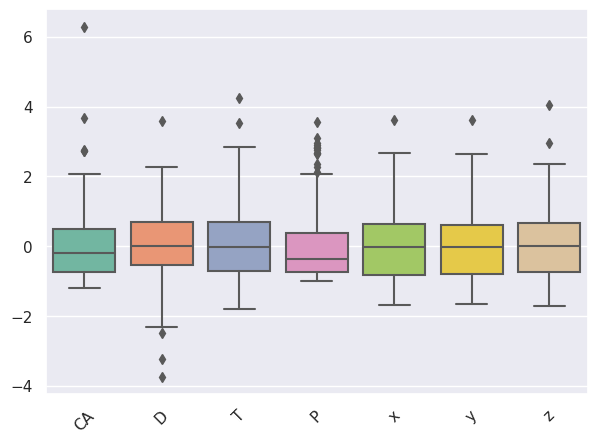

In [ ]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

/usr/local/lib/python3.9/dist-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:.25'` for same effect.
  warnings.warn(msg, FutureWarning)


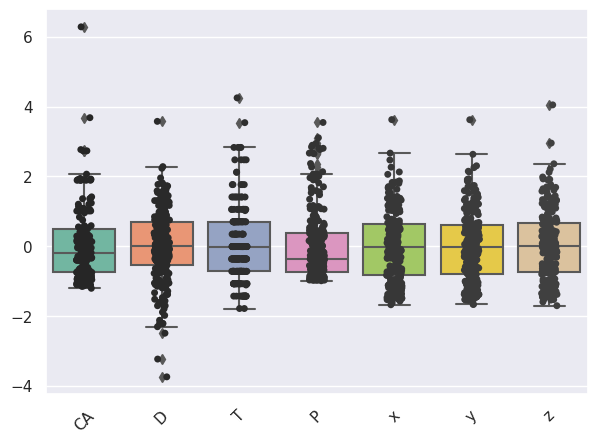

In [ ]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()
ax = plt.figure()    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

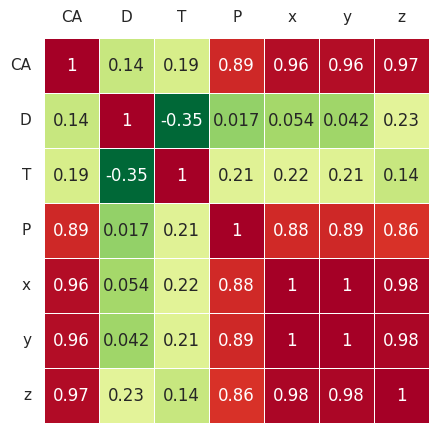

In [ ]:
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

##**Principal Component Analysis (PCA)**

Text(0, 0.5, '$Z_2$')

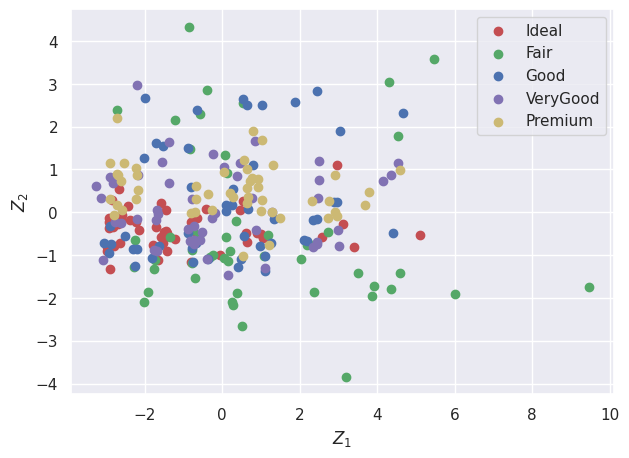

In [ ]:
pca = PCA()
Z = pca.fit_transform(X)

idx_Ideal = np.where(y == 'Ideal')
idx_Fair = np.where(y == 'Fair')
idx_Good = np.where(y == 'Good')
idx_VeryGood = np.where(y == 'Very Good')
idx_Premium = np.where(y == 'Premium')

plt. figure()
plt.scatter(Z[idx_Ideal,0], Z[idx_Ideal,1], c='r', label='Ideal')
plt.scatter(Z[idx_Fair,0], Z[idx_Fair,1], c='g', label='Fair')
plt.scatter(Z[idx_Good,0], Z[idx_Good,1], c='b', label='Good')
plt.scatter(Z[idx_VeryGood,0], Z[idx_VeryGood,1], c='m', label='VeryGood')
plt.scatter(Z[idx_Premium,0], Z[idx_Premium,1], c='y', label='Premium')

plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

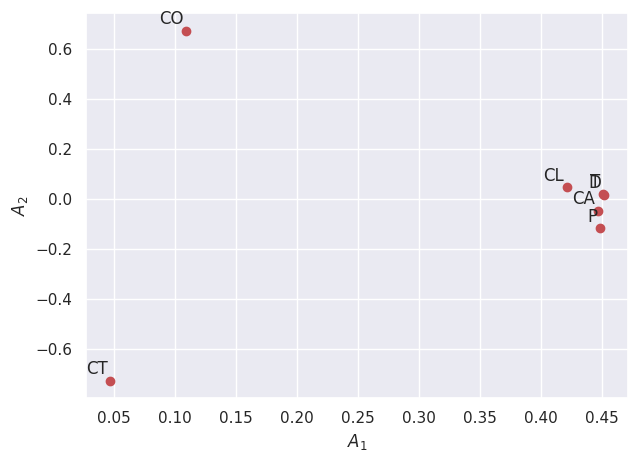

In [ ]:
A = pca.components_.T 

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

In [ ]:
A

array([[ 4.46601517e-01, -4.85550337e-02, -9.05222230e-03,
        -7.20097342e-02,  8.88754297e-01, -1.66488144e-02,
         5.25429903e-02],
       [ 4.67731175e-02, -7.27396660e-01,  6.60006725e-01,
         9.69104005e-02, -5.71361436e-02, -7.91317257e-04,
         1.42971000e-01],
       [ 1.09099411e-01,  6.72253560e-01,  7.32035354e-01,
         8.10110788e-03, -9.92816492e-03, -1.06719910e-02,
        -4.31531480e-03],
       [ 4.21474625e-01,  4.63682742e-02, -1.16945862e-01,
         8.87196446e-01, -1.37185488e-01,  1.62341402e-02,
        -1.82167398e-02],
       [ 4.51598388e-01,  1.58556105e-02, -6.96420336e-02,
        -2.70417755e-01, -2.55043590e-01,  7.32997334e-01,
         3.39852021e-01],
       [ 4.51286809e-01,  1.87629850e-02, -9.29343181e-02,
        -2.50487237e-01, -2.85046058e-01, -6.77750919e-01,
         4.28963821e-01],
       [ 4.48569874e-01, -1.17720819e-01,  3.56410771e-02,
        -2.49740250e-01, -2.04044962e-01, -5.20898488e-02,
        -8.2276284

/usr/local/lib/python3.9/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  self._transforms = np.empty((0, 3, 3))


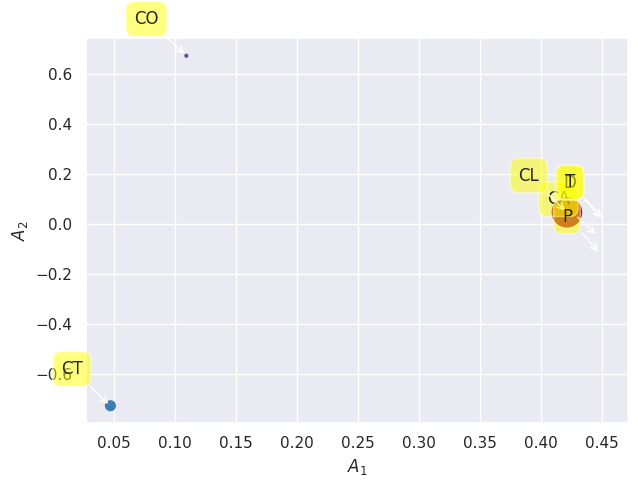

In [ ]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree plot**

Text(0, 0.5, 'Explained variance')

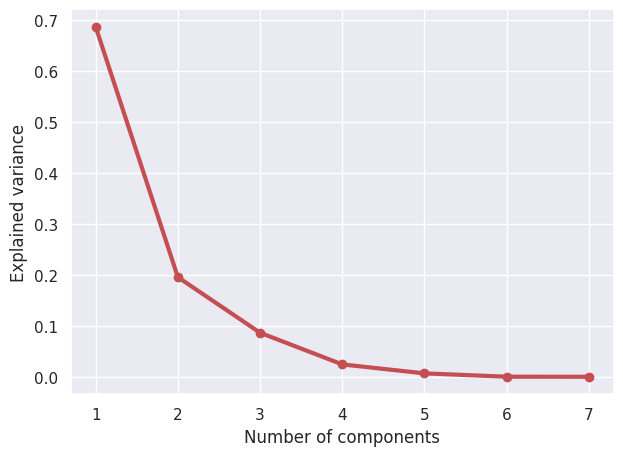

In [ ]:
#Eigenvalues
Lambda = pca.explained_variance_ 

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 

In [ ]:
Lambda

array([4.82620869e+00, 1.37404245e+00, 6.07587221e-01, 1.70918039e-01,
       4.71421462e-02, 1.51928656e-03, 6.94618334e-04])

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

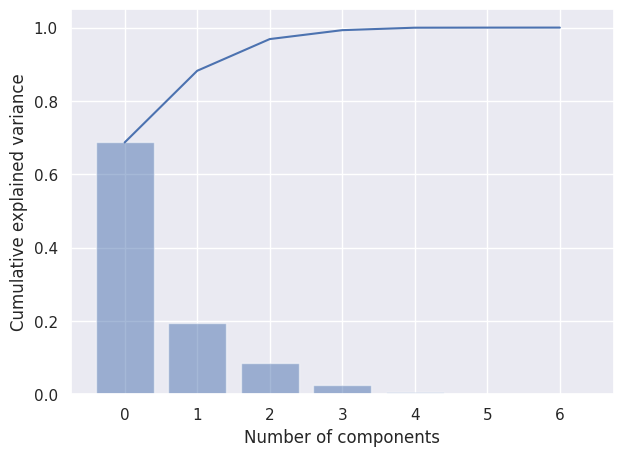

In [ ]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

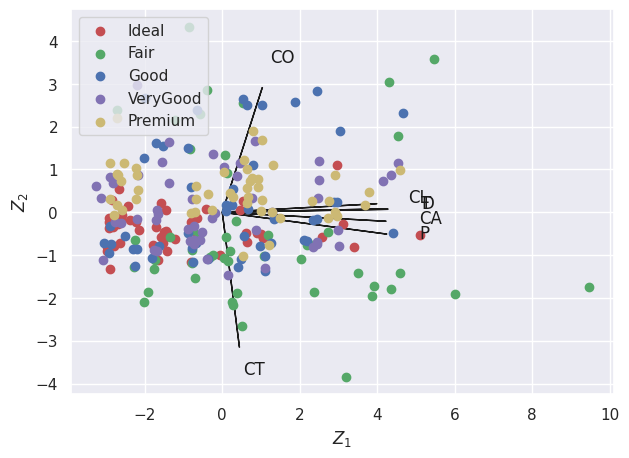

In [ ]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt.figure()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_Ideal,0], Z[idx_Ideal,1], c='r', label='Ideal')
plt.scatter(Z[idx_Fair,0], Z[idx_Fair,1], c='g', label='Fair')
plt.scatter(Z[idx_Good,0], Z[idx_Good,1], c='b', label='Good')
plt.scatter(Z[idx_VeryGood,0], Z[idx_VeryGood,1], c='m', label='VeryGood')
plt.scatter(Z[idx_Premium,0], Z[idx_Premium,1], c='y', label='Premium')

plt.legend(loc='upper left')

##**Using PCA Library**

In [ ]:
!pip install pca

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [7] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [7] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


**Principal Components**

In [ ]:
out['PC']

,PC1,PC2,PC3
0,2.369004,-1.863175,0.366824
1,1.182183,-0.531314,1.265591
2,-0.568913,2.293513,1.846340
3,-0.249063,-0.987680,0.928047
4,2.727057,-0.455990,0.955283
...,...,...,...
245,0.880513,-0.422225,-0.248377
246,-0.742920,-0.651634,0.207064
247,1.276211,-0.001553,-0.691343
248,2.501539,0.753314,-1.578753


**Scatter plot**

[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '3 Principal Components explain [99.29%] of the variance'}, xlabel='PC1 (68.6% expl.var)', ylabel='PC2 (19.5% expl.var)'>)

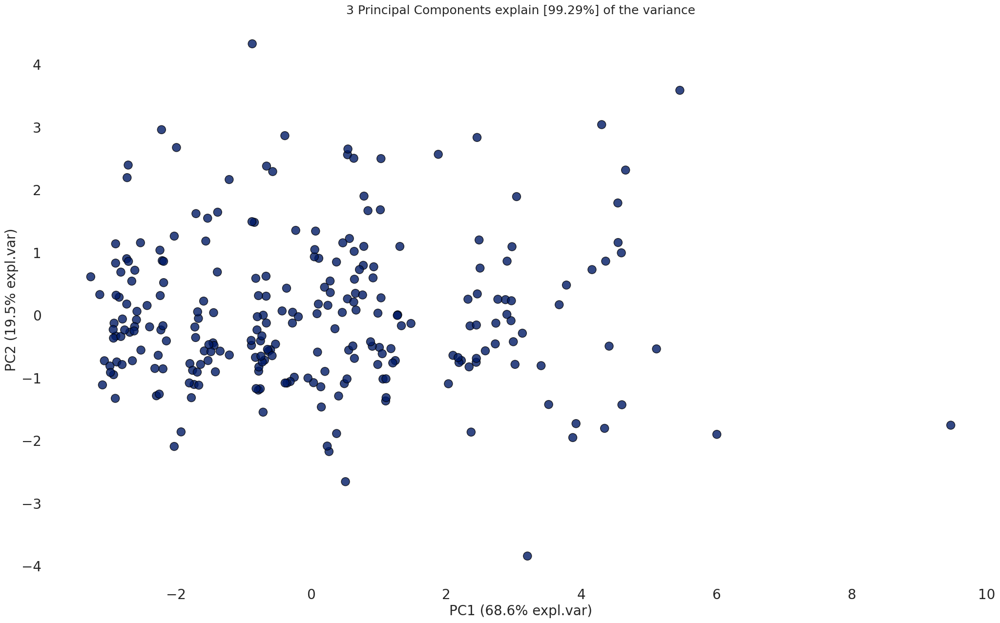

In [ ]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [ ]:
A = out['loadings'].T

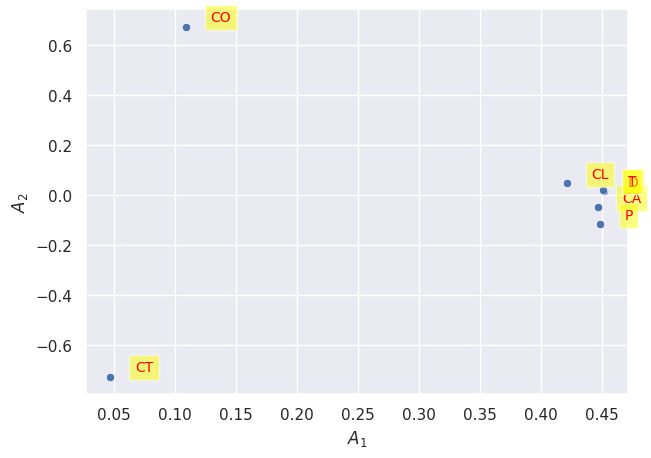

In [ ]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

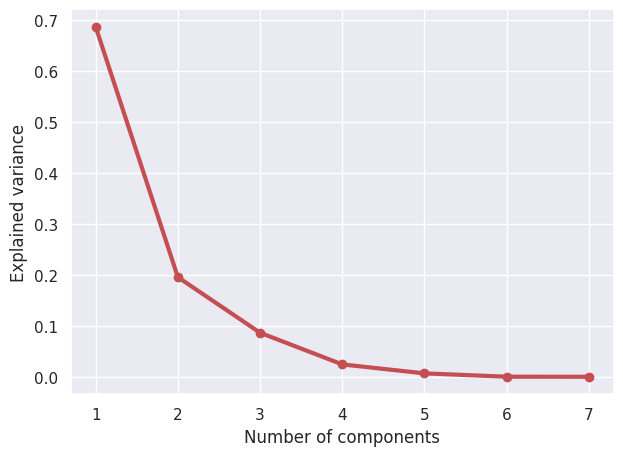

In [ ]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

**Explained Variance Plot**

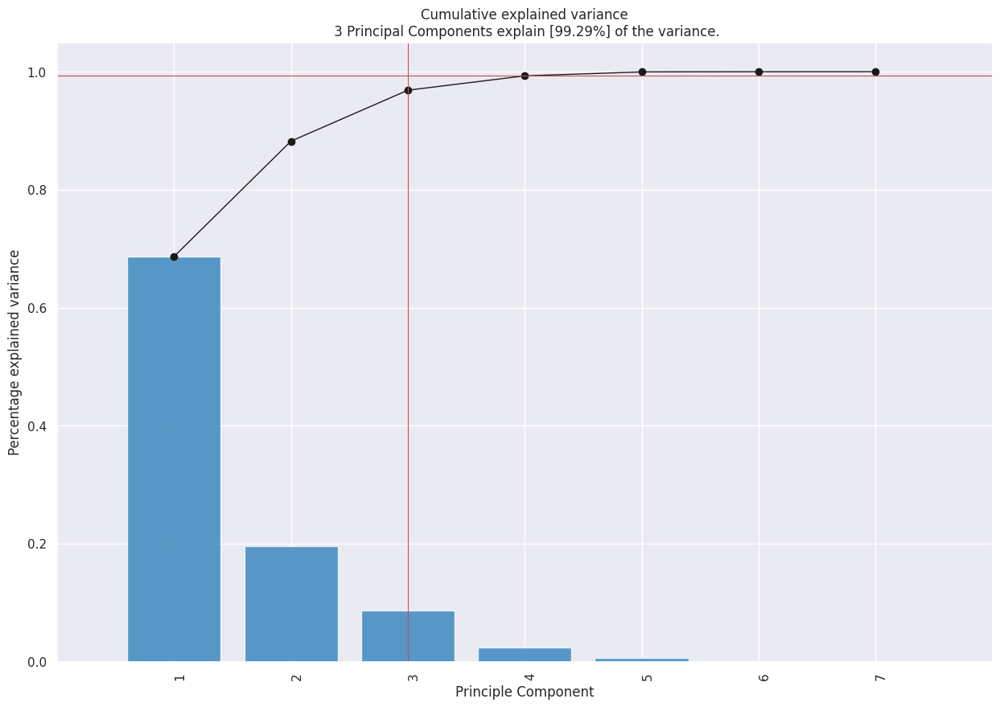

<Figure size 700x500 with 0 Axes>

In [ ]:
model.plot();

**Biplot**

[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


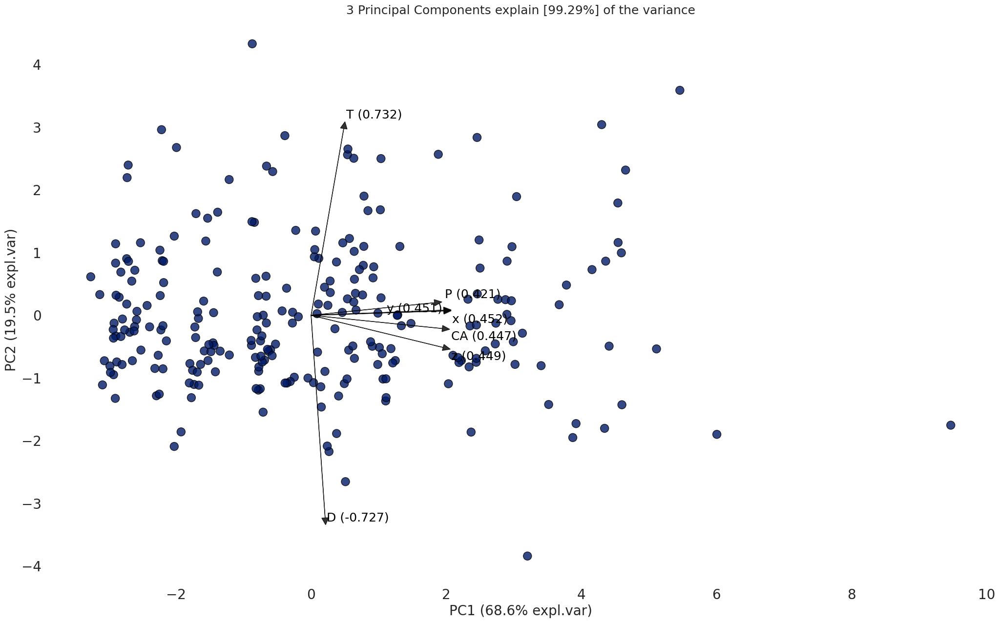

(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '3 Principal Components explain [99.29%] of the variance'}, xlabel='PC1 (68.6% expl.var)', ylabel='PC2 (19.5% expl.var)'>)

In [ ]:
model.biplot(label=True, legend=False)

[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 vs PC3 with loadings.


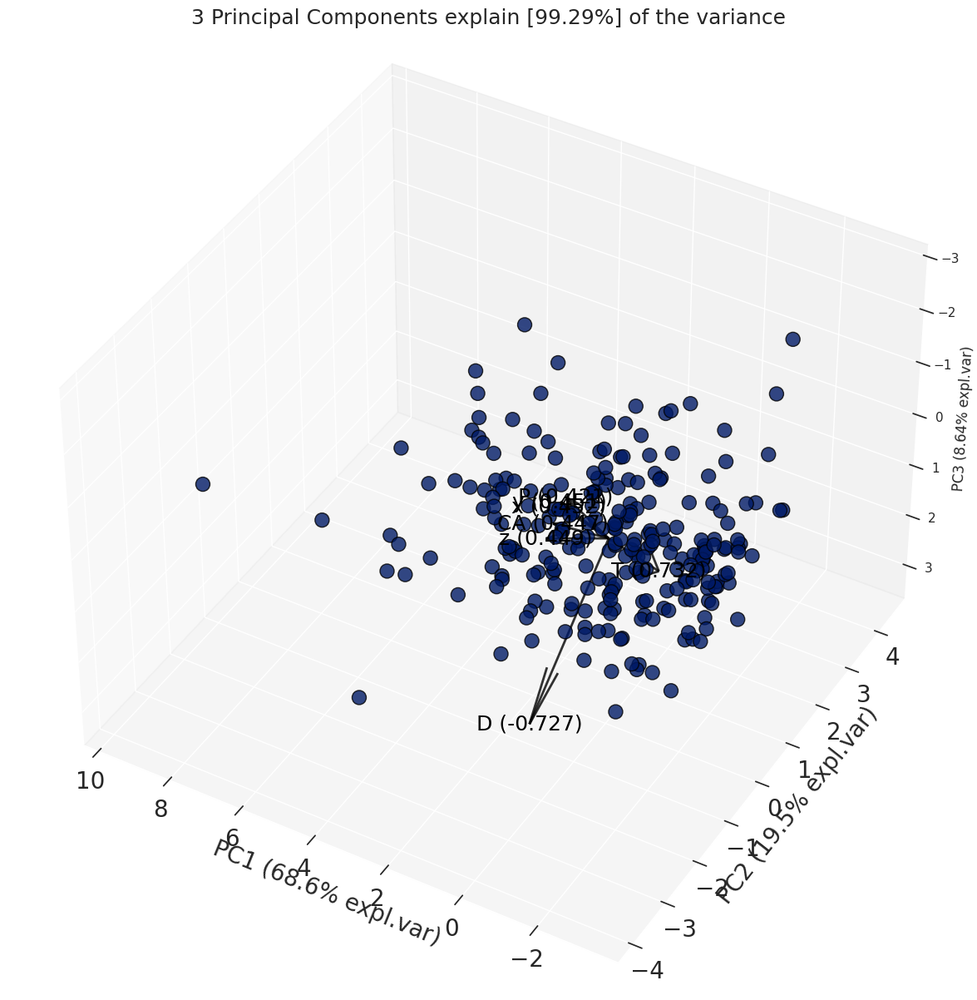

(<Figure size 2500x1500 with 1 Axes>,
 <Axes3D: title={'center': '3 Principal Components explain [99.29%] of the variance'}, xlabel='PC1 (68.6% expl.var)', ylabel='PC2 (19.5% expl.var)', zlabel='PC3 (8.64% expl.var)'>)

In [ ]:
model.biplot3d(label=True, legend=False)

#**Classification**

**Using PyCaret**

PyCaret uses interactive plotting ability. In order to render interactive plots in Google Colab, run the below line of code in your colab notebook.

In [ ]:
#For Google Colab only
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In order to demonstrate the predict_model() function on unseen data, a sample of 21 observations has been withheld from the original dataset to be used for predictions. This should not be confused with a train/test split as this particular split is performed to simulate a real life scenario. Another way to think about this is that these 21 records were not available at the time when the machine learning experiment was performed.

In [ ]:
data = df2.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (225, 10)
Unseen Data For Predictions: (53715, 10)


**Setting up the Environment in PyCaret**

The setup() function initializes the environment in pycaret and creates the transformation pipeline to prepare the data for modeling and deployment. setup() must be called before executing any other function in pycaret. It takes two mandatory parameters: a pandas dataframe and the name of the target column. All other parameters are optional and are used to customize the pre-processing pipeline (we will see them in later tutorials).

When setup() is executed, PyCaret's inference algorithm will automatically infer the data types for all features based on certain properties. The data type should be inferred correctly but this is not always the case. To account for this, PyCaret displays a table containing the features and their inferred data types after setup() is executed. If all of the data types are correctly identified enter can be pressed to continue or quit can be typed to end the expriment. Ensuring that the data types are correct is of fundamental importance in PyCaret as it automatically performs a few pre-processing tasks which are imperative to any machine learning experiment. These tasks are performed differently for each data type which means it is very important for them to be correctly configured.

In [ ]:
from pycaret.classification import *
clf = setup(data=data, target='CT', train_size=0.7, session_id=123)

,Description,Value
0,session_id,123
1,Target,CT
2,Target Type,Multiclass
3,Label Encoded,"Fair: 0, Good: 1, Ideal: 2, Premium: 3, Very G..."
4,Original Data,"(225, 10)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,2
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='CT',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strategy=...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluste

Once the setup has been succesfully executed it prints the information grid which contains several important pieces of information. Most of the information is related to the pre-processing pipeline which is constructed when setup() is executed. The majority of these features are out of scope for the purposes of this tutorial however a few important things to note at this stage include:

* **session_id** : A pseduo-random number distributed as a seed in all functions for later reproducibility. If no session_id is passed, a random number is automatically generated that is distributed to all functions. In this experiment, the session_id is set as 123 for later reproducibility.

* **Target Type** : Binary or Multiclass. The Target type is automatically detected and shown. There is no difference in how the experiment is performed for Binary or Multiclass problems. All functionalities are identical.

* **Label Encoded** : When the Target variable is of type string (i.e. 'Yes' or 'No') instead of 1 or 0, it automatically encodes the label into 1 and 0 and displays the mapping (0 : No, 1 : Yes) for reference. 

* **Original Data** : Displays the original shape of the dataset. In this experiment (189, 8) means 189 samples and 8 features including the class column.

* **Missing Values** : When there are missing values in the original data this will show as True. For this experiment there are no missing values in the dataset.

* **Numeric Features** : The number of features inferred as numeric. In this dataset, 7 out of 8 features are inferred as numeric.

* **Categorical Features** : The number of features inferred as categorical. In this dataset, there are no categorical features.

* **Transformed Train Set** : Displays the shape of the transformed training set. Notice that the original shape of (189, 8) is transformed into (132, 7) for the transformed train set.

* **Transformed Test Set** : Displays the shape of the transformed test/hold-out set. There are 57 samples in test/hold-out set. This split is based on the default value of 70/30 that can be changed using the train_size parameter in setup.

Notice how a few tasks that are imperative to perform modeling are automatically handled such as missing value imputation, categorical encoding etc. Most of the parameters in setup() are optional and used for customizing the pre-processing pipeline. 

**Comparing All Models**

In [ ]:
 #show the best model and their statistics
 best_model = compare_models() 

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
xgboost,Extreme Gradient Boosting,0.6692,0.8626,0.6667,0.6887,0.6611,0.5849,0.5932,0.190
lightgbm,Light Gradient Boosting Machine,0.6558,0.8739,0.6517,0.6796,0.6412,0.5680,0.5794,0.296
gbc,Gradient Boosting Classifier,0.6371,0.8754,0.6383,0.6385,0.6227,0.5462,0.5555,0.311
rf,Random Forest Classifier,0.5983,0.8417,0.5983,0.5941,0.5811,0.4972,0.5080,0.160
dt,Decision Tree Classifier,0.5542,0.7224,0.5450,0.5730,0.5397,0.4422,0.4526,0.011
ada,Ada Boost Classifier,0.5162,0.7608,0.5117,0.4255,0.4242,0.3893,0.4653,0.073
lda,Linear Discriminant Analysis,0.4325,0.7296,0.4317,0.4553,0.4184,0.2914,0.2995,0.014
ridge,Ridge Classifier,0.3942,0.0000,0.3900,0.3705,0.3582,0.2422,0.2549,0.010
nb,Naive Bayes,0.3746,0.6738,0.3733,0.3980,0.3504,0.2191,0.2366,0.012
et,Extra Trees Classifier,0.3687,0.7108,0.3650,0.3588,0.3406,0.2088,0.2208,0.238


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 2
INFO:logs:XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)
INFO:logs:compare_models() succesfully completed......................................


In [ ]:
best_model

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

**Create a Model**

create_model is the most granular function in PyCaret and is often the foundation behind most of the PyCaret functionalities. As the name suggests this function trains and evaluates a model using cross validation that can be set with fold parameter. The output prints a score grid that shows Accuracy, Recall, Precision, F1, Kappa and MCC by fold.

For the remaining part of this tutorial, we will work with the below models as our candidate models. The selections are for illustration purposes only and do not necessarily mean they are the top performing or ideal for this type of data.

* Extreme Gradient Boosting ('xgboost')
* Light Gradient Boosting Machine ('lightgbm')
* Gradient Boosting Classifier ('gbc')
* Random Forest Classifier ('rf')

There are many classifiers available in the model library of PyCaret. Please view the create_model() docstring for the list of all available models.

**Create Extreme Gradient Boosting**

In [ ]:
dt = create_model('xgboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.4375,0.7512,0.4500,0.4375,0.4375,0.2941,0.2941
1,0.7500,0.9083,0.7500,0.8125,0.7518,0.6878,0.7088
2,0.6250,0.8702,0.6167,0.6406,0.6250,0.5317,0.5343
3,0.6250,0.8337,0.6167,0.7188,0.6188,0.5294,0.5486
4,0.5625,0.8349,0.5500,0.5125,0.5198,0.4483,0.4598
5,0.6250,0.8205,0.5667,0.5729,0.5821,0.5152,0.5291
6,0.3125,0.6715,0.3167,0.3021,0.3036,0.1415,0.1422
7,0.7333,0.8944,0.7333,0.8500,0.7248,0.6667,0.6984
8,0.5333,0.8222,0.5333,0.5333,0.5067,0.4167,0.4313
9,0.7333,0.8778,0.7333,0.8300,0.7314,0.6667,0.6860


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 5
INFO:logs:XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
#trained model object is stored in the variable 'dt'. 
dt

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

**Tune a Model:** How to automatically tune the hyper-parameters of a multiclass model. When a model is created using the create_model() function it uses the default hyperparameters. In order to tune hyperparameters, the tune_model() function is used. The tune_model() function is a random grid search of hyperparameters over a pre-defined search space. By default, it is set to optimize Accuracy but this can be changed using optimize parameter. This function automatically tunes the hyperparameters of a model on a pre-defined search space and scores it using stratified cross validation. The output prints a score grid that shows Accuracy, AUC, Recall, Precision, F1 and Kappa by fold.

**Tune Extreme Gradient Boosting Model**

In [ ]:
tuned_dt = tune_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5000,0.7981,0.5000,0.3969,0.4415,0.3695,0.3810
1,0.5625,0.9371,0.5500,0.6562,0.5646,0.4510,0.4673
2,0.6875,0.8846,0.6667,0.6125,0.6406,0.6078,0.6201
3,0.7500,0.8329,0.7500,0.7688,0.7406,0.6863,0.6966
4,0.4375,0.7780,0.4167,0.3616,0.3750,0.2941,0.3114
5,0.7500,0.8937,0.7000,0.6667,0.6932,0.6800,0.6979
6,0.3750,0.6887,0.3833,0.4125,0.3749,0.2233,0.2289
7,0.6000,0.7778,0.6000,0.7667,0.6032,0.5000,0.5270
8,0.6667,0.8833,0.6667,0.7033,0.6348,0.5833,0.6002
9,0.6667,0.8667,0.6667,0.6667,0.6495,0.5833,0.5899


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 6
INFO:logs:XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
#tuned model object is stored in the variable 'tuned_dt'. 
tuned_dt

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

**Evaluate Extreme Gradient Boosting Model**

Update statmodels

In [ ]:
!pip install statsmodels --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


How to analyze model performance using various plots

In [ ]:
evaluate_model(tuned_dt)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Light Gradient Boosting Machine Model**

In [ ]:
lightgbm = create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5000,0.7985,0.5167,0.4531,0.4600,0.3695,0.3850
1,0.7500,0.9135,0.7500,0.8929,0.7580,0.6878,0.7278
2,0.6250,0.9038,0.6000,0.5625,0.5893,0.5294,0.5374
3,0.5000,0.8089,0.4833,0.4875,0.4781,0.3725,0.3902
4,0.5000,0.7873,0.4833,0.5000,0.5000,0.3725,0.3725
5,0.6875,0.8433,0.6333,0.6042,0.6307,0.6000,0.6158
6,0.3750,0.7196,0.3500,0.3571,0.3489,0.2040,0.2105
7,0.4667,0.8722,0.4667,0.5417,0.4358,0.3333,0.3701
8,0.5333,0.8556,0.5333,0.5300,0.5114,0.4167,0.4262
9,0.6000,0.8722,0.6000,0.6733,0.6233,0.5000,0.5085


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 7
INFO:logs:LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:create_model() succesfully completed......................................


**Tune Light Gradient Boosting Machine Model**

In [ ]:
tuned_lightgbm = tune_model(lightgbm, custom_grid = {'num_leaves' : np.arange(0,50,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5000,0.8057,0.5000,0.5000,0.4946,0.3725,0.3744
1,0.6250,0.8890,0.6167,0.7156,0.6250,0.5317,0.5451
2,0.6875,0.8894,0.6667,0.6125,0.6406,0.6078,0.6201
3,0.5000,0.7720,0.4833,0.4688,0.4708,0.3725,0.3860
4,0.6250,0.7977,0.6000,0.5594,0.5829,0.5271,0.5324
5,0.6250,0.8637,0.6333,0.6969,0.5970,0.5294,0.5456
6,0.3125,0.6294,0.3000,0.2411,0.2625,0.1373,0.1461
7,0.6000,0.8167,0.6000,0.6533,0.5776,0.5000,0.5145
8,0.6000,0.8556,0.6000,0.5533,0.5167,0.5000,0.5406
9,0.6667,0.8222,0.6667,0.6667,0.6495,0.5833,0.5899


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 8
INFO:logs:LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=2, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate Light Gradient Boosting Machine Model**

In [ ]:
evaluate_model(tuned_lightgbm)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=2, objective=None,
               random_state=123, reg_alpha=0.0, reg_lambda=0.0, silent='warn',
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Gradient Boosting Classifier Model**

In [ ]:
gbc = create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.3125,0.6979,0.3333,0.2812,0.2750,0.1415,0.1458
1,0.6875,0.9463,0.6833,0.7500,0.6893,0.6098,0.6283
2,0.6250,0.8654,0.6167,0.6125,0.6049,0.5317,0.5396
3,0.5625,0.8125,0.5500,0.6562,0.5946,0.4510,0.4555
4,0.5625,0.8209,0.5500,0.5938,0.5696,0.4510,0.4532
5,0.6875,0.9175,0.6333,0.6333,0.6335,0.5980,0.6206
6,0.3125,0.6134,0.3000,0.3385,0.3214,0.1415,0.1422
7,0.6000,0.8444,0.6000,0.7300,0.5857,0.5000,0.5207
8,0.6000,0.9222,0.6000,0.7000,0.5933,0.5000,0.5207
9,0.6667,0.8722,0.6667,0.7167,0.6524,0.5833,0.5933


INFO:logs:create_model_container: 28
INFO:logs:master_model_container: 28
INFO:logs:display_container: 15
INFO:logs:GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)
INFO:logs:create_model() succesfully completed......................................


**Tune Gradient Boosting Classifier Model**

In [ ]:
tuned_gbc = tune_model(gbc)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6250,0.8446,0.6500,0.6146,0.6161,0.5317,0.5343
1,0.7500,0.9079,0.7500,0.8125,0.7518,0.6878,0.7088
2,0.6875,0.8606,0.6667,0.6406,0.6607,0.6078,0.6108
3,0.5000,0.8273,0.4833,0.6469,0.5317,0.3725,0.3820
4,0.5625,0.7973,0.5500,0.5000,0.5125,0.4510,0.4673
5,0.6875,0.8818,0.6333,0.6333,0.6335,0.5980,0.6206
6,0.3125,0.6659,0.3000,0.2562,0.2808,0.1330,0.1343
7,0.6667,0.8444,0.6667,0.7633,0.6648,0.5833,0.6002
8,0.6667,0.9000,0.6667,0.7400,0.6400,0.5833,0.6074
9,0.6000,0.8833,0.6000,0.5833,0.5848,0.5000,0.5028


INFO:logs:create_model_container: 39
INFO:logs:master_model_container: 39
INFO:logs:display_container: 12
INFO:logs:GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.15, loss='deviance', max_depth=7,
                           max_features=1.0, max_leaf_nodes=None,
                           min_impurity_decrease=0.02, min_impurity_split=None,
                           min_samples_leaf=5, min_samples_split=5,
                           min_weight_fraction_leaf=0.0, n_estimators=230,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=0.85, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate Gradient Boosting Classifier Model**

In [ ]:
evaluate_model(tuned_gbc)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.15, loss='deviance', max_depth=7,
                           max_features=1.0, max_leaf_nodes=None,
                           min_impurity_decrease=0.02, min_impurity_split=None,
                           min_samples_leaf=5, min_samples_split=5,
                           min_weight_fraction_leaf=0.0, n_estimators=230,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=0.85, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create K neighbors Classifier Model**

In [ ]:
knn = create_model ('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6250,0.8706,0.6333,0.7188,0.6188,0.5294,0.5486
1,0.7500,0.8832,0.7333,0.7604,0.7375,0.6832,0.6937
2,0.6875,0.7897,0.6833,0.7625,0.6875,0.6078,0.6201
3,0.6250,0.8373,0.6167,0.5406,0.5774,0.5271,0.5351
4,0.3750,0.7212,0.3333,0.2750,0.3160,0.2118,0.2207
5,0.7500,0.8218,0.7500,0.8229,0.7214,0.6893,0.7100
6,0.4375,0.6959,0.4667,0.4241,0.3646,0.3077,0.3478
7,0.6000,0.6778,0.6000,0.5524,0.5467,0.5000,0.5406
8,0.6000,0.8444,0.6000,0.7000,0.5876,0.5000,0.5238
9,0.7333,0.8806,0.7333,0.7500,0.7314,0.6667,0.6704


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 5
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


**Tuned K neighbors Classifier Model**

In [ ]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6875,0.8618,0.7000,0.7760,0.6723,0.6098,0.6349
1,0.7500,0.9093,0.7500,0.7344,0.7357,0.6863,0.6897
2,0.6875,0.8069,0.6833,0.7625,0.6875,0.6078,0.6201
3,0.5000,0.8281,0.4833,0.4625,0.4738,0.3695,0.3732
4,0.5000,0.6659,0.4667,0.4479,0.4571,0.3663,0.3759
5,0.6875,0.8075,0.6833,0.6792,0.6681,0.6078,0.6169
6,0.4375,0.6639,0.4667,0.4500,0.3875,0.3010,0.3183
7,0.6000,0.6944,0.6000,0.5524,0.5467,0.5000,0.5406
8,0.6000,0.8167,0.6000,0.6200,0.5900,0.5000,0.5085
9,0.7333,0.8694,0.7333,0.7833,0.7390,0.6667,0.6742


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 7
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=-1, n_neighbors=4, p=2,
                     weights='uniform')
INFO:logs:tune_model() succesfully completed......................................


**Evaluate K neighbors Classifier Model**

In [ ]:
evaluate_model(tuned_knn)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=-1, n_neighbors=4, p=2,
                     weights='uniform'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Random Forest Model**

In [ ]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6250,0.8349,0.6333,0.5688,0.5551,0.5340,0.5647
1,0.8750,0.9587,0.8667,0.9062,0.8527,0.8431,0.8558
2,0.7500,0.8942,0.7333,0.8312,0.7415,0.6863,0.7037
3,0.6250,0.8686,0.6167,0.7000,0.6438,0.5294,0.5374
4,0.5000,0.7500,0.4667,0.4375,0.4643,0.3725,0.3782
5,0.7500,0.8605,0.7333,0.8417,0.7406,0.6816,0.7068
6,0.4375,0.7250,0.4500,0.4250,0.4061,0.3010,0.3085
7,0.6000,0.8556,0.6000,0.7750,0.5891,0.5000,0.5552
8,0.7333,0.9389,0.7333,0.8400,0.7200,0.6667,0.6942
9,0.7333,0.9222,0.7333,0.7500,0.7314,0.6667,0.6704


INFO:logs:create_model_container: 40
INFO:logs:master_model_container: 40
INFO:logs:display_container: 13
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)
INFO:logs:create_model() succesfully completed......................................


**Tune Random Forest Model**

In [ ]:
tuned_rf = tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5000,0.7131,0.5167,0.5312,0.4415,0.3816,0.4034
1,0.6875,0.9026,0.6833,0.6875,0.6875,0.6078,0.6078
2,0.6875,0.8365,0.6667,0.7188,0.6750,0.6078,0.6266
3,0.6250,0.8914,0.6167,0.7125,0.6104,0.5271,0.5493
4,0.5625,0.7740,0.5333,0.4656,0.5045,0.4510,0.4625
5,0.6250,0.8251,0.6333,0.4667,0.5281,0.5294,0.5633
6,0.3750,0.6318,0.4000,0.3562,0.3509,0.2195,0.2239
7,0.5333,0.7778,0.5333,0.4067,0.4467,0.4167,0.4392
8,0.5333,0.8278,0.5333,0.6633,0.5505,0.4167,0.4287
9,0.6667,0.8500,0.6667,0.6000,0.6229,0.5833,0.5899


INFO:logs:create_model_container: 41
INFO:logs:master_model_container: 41
INFO:logs:display_container: 14
INFO:logs:RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate Random Forest Model**

In [ ]:
evaluate_model(tuned_rf)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

#**Tune the Best Model**

In [ ]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5000,0.7981,0.5000,0.3969,0.4415,0.3695,0.3810
1,0.5625,0.9371,0.5500,0.6562,0.5646,0.4510,0.4673
2,0.6875,0.8846,0.6667,0.6125,0.6406,0.6078,0.6201
3,0.7500,0.8329,0.7500,0.7688,0.7406,0.6863,0.6966
4,0.4375,0.7780,0.4167,0.3616,0.3750,0.2941,0.3114
5,0.7500,0.8937,0.7000,0.6667,0.6932,0.6800,0.6979
6,0.3750,0.6887,0.3833,0.4125,0.3749,0.2233,0.2289
7,0.6000,0.7778,0.6000,0.7667,0.6032,0.5000,0.5270
8,0.6667,0.8833,0.6667,0.7033,0.6348,0.5833,0.6002
9,0.6667,0.8667,0.6667,0.6667,0.6495,0.5833,0.5899


INFO:logs:create_model_container: 42
INFO:logs:master_model_container: 42
INFO:logs:display_container: 15
INFO:logs:XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
tuned_best_model

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

**Evaluate the Best Model**

One way to analyze the performance of models is to use the evaluate_model() function which displays a user interface for all of the available plots for a given model. It internally uses the plot_model() function.

In [ ]:
evaluate_model(tuned_best_model)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=None, gpu_id=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.5, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=1, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

#**Classification + PCA**

In [ ]:
clf_pca = setup(data=data, target='CT', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,123
1,Target,CT
2,Target Type,Multiclass
3,Label Encoded,"Fair: 0, Good: 1, Ideal: 2, Premium: 3, Very G..."
4,Original Data,"(225, 10)"
5,Missing Values,False
6,Numeric Features,7
7,Categorical Features,2
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='CT',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strategy=...
                ('rem_outliers', 'passthrough'), ('cluster_all', 'passthrough'),
                ('dummy', Dummify(target='CT')),
                ('fix_perfect', Remove_100(t

In [ ]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.6696,0.8485,0.6650,0.6675,0.6408,0.5861,0.6042,0.241
rf,Random Forest Classifier,0.6629,0.8609,0.6567,0.7075,0.6445,0.5781,0.5975,0.169
knn,K Neighbors Classifier,0.6183,0.8022,0.6150,0.6307,0.5889,0.5223,0.5411,0.039
xgboost,Extreme Gradient Boosting,0.5938,0.8285,0.5867,0.6210,0.5801,0.4898,0.5033,0.140
qda,Quadratic Discriminant Analysis,0.5667,0.8383,0.5583,0.5905,0.5556,0.4561,0.4682,0.015
gbc,Gradient Boosting Classifier,0.5617,0.8313,0.5533,0.6012,0.5520,0.4508,0.4620,0.296
lightgbm,Light Gradient Boosting Machine,0.5538,0.8375,0.5417,0.5602,0.5336,0.4386,0.4544,0.316
nb,Naive Bayes,0.5529,0.8138,0.5467,0.5299,0.5253,0.4393,0.4512,0.017
dt,Decision Tree Classifier,0.5425,0.7138,0.5417,0.5572,0.5272,0.4271,0.4386,0.021
lda,Linear Discriminant Analysis,0.4133,0.7548,0.4067,0.3906,0.3748,0.2654,0.2763,0.017


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 2
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)
INFO:logs:compare_models() succesfully completed......................................


In [ ]:
best_model_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)

**Tune the Best Model**

In [ ]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7500,0.8413,0.7500,0.6188,0.6756,0.6847,0.7060
1,0.6250,0.9275,0.6167,0.5719,0.5461,0.5271,0.5615
2,0.6875,0.8702,0.6667,0.5781,0.6107,0.6078,0.6400
3,0.6250,0.8293,0.6167,0.5719,0.5845,0.5271,0.5379
4,0.5000,0.8025,0.4667,0.3875,0.4365,0.3695,0.3770
5,0.6875,0.9037,0.6833,0.7792,0.6490,0.6040,0.6328
6,0.3750,0.7416,0.3833,0.4031,0.3682,0.2233,0.2289
7,0.7333,0.8500,0.7333,0.8033,0.7148,0.6667,0.6860
8,0.6667,0.8444,0.6667,0.6000,0.6076,0.5833,0.6187
9,0.6000,0.9000,0.6000,0.5333,0.5562,0.5000,0.5056


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 3
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features=1.0, max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0,
                     min_impurity_split=None, min_samples_leaf=4,
                     min_samples_split=7, min_weight_fraction_leaf=0.0,
                     n_estimators=200, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
tuned_best_model_pca

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features=1.0, max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0,
                     min_impurity_split=None, min_samples_leaf=4,
                     min_samples_split=7, min_weight_fraction_leaf=0.0,
                     n_estimators=200, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)

**Evaluate the Best Model**

One way to analyze the performance of models is to use the evaluate_model() function which displays a user interface for all of the available plots for a given model. It internally uses the plot_model() function.

In [ ]:
evaluate_model(tuned_best_model_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features=1.0, max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0,
                     min_impurity_split=None, min_samples_leaf=4,
                     min_samples_split=7, min_weight_fraction_leaf=0.0,
                     n_estimators=200, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Note:** The AUC metric is not available for Multiclass classification however the column will still be shown with zero values to maintain consistency between the Binary Classification and Multiclass Classification display grids.

#**Explainable AI with Shapley values**

Shapley values are a widely used approach from cooperative game theory that come with desirable properties.

In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
print("Numpy version: ", np.__version__)

Numpy version:  1.22.4


In [ ]:
!pip install numba==0.53

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import shap

In [ ]:
et_pca = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6250,0.8381,0.6500,0.5188,0.5454,0.5340,0.5529
1,0.8125,0.9255,0.8000,0.6906,0.7388,0.7647,0.7924
2,0.8750,0.9014,0.8667,0.9250,0.8781,0.8431,0.8558
3,0.5000,0.7993,0.4833,0.4344,0.4598,0.3725,0.3860
4,0.5000,0.7139,0.4667,0.4167,0.4500,0.3663,0.3739
5,0.7500,0.8699,0.7333,0.7781,0.7371,0.6847,0.6950
6,0.5000,0.7506,0.5167,0.5000,0.4677,0.3786,0.3921
7,0.6000,0.8000,0.6000,0.7750,0.6091,0.5000,0.5514
8,0.8000,0.9611,0.8000,0.8700,0.7814,0.7500,0.7717
9,0.7333,0.9250,0.7333,0.7667,0.7410,0.6667,0.6704


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 8
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=123, verbose=0,
                     warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
tuned_et_pca = tune_model(et_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7500,0.8413,0.7500,0.6188,0.6756,0.6847,0.7060
1,0.6250,0.9275,0.6167,0.5719,0.5461,0.5271,0.5615
2,0.6875,0.8702,0.6667,0.5781,0.6107,0.6078,0.6400
3,0.6250,0.8293,0.6167,0.5719,0.5845,0.5271,0.5379
4,0.5000,0.8025,0.4667,0.3875,0.4365,0.3695,0.3770
5,0.6875,0.9037,0.6833,0.7792,0.6490,0.6040,0.6328
6,0.3750,0.7416,0.3833,0.4031,0.3682,0.2233,0.2289
7,0.7333,0.8500,0.7333,0.8033,0.7148,0.6667,0.6860
8,0.6667,0.8444,0.6667,0.6000,0.6076,0.5833,0.6187
9,0.6000,0.9000,0.6000,0.5333,0.5562,0.5000,0.5056


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 9
INFO:logs:ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features=1.0, max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0,
                     min_impurity_split=None, min_samples_leaf=4,
                     min_samples_split=7, min_weight_fraction_leaf=0.0,
                     n_estimators=200, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6250,0.8349,0.6333,0.5688,0.5551,0.5340,0.5647
1,0.8750,0.9587,0.8667,0.9062,0.8527,0.8431,0.8558
2,0.7500,0.8942,0.7333,0.8312,0.7415,0.6863,0.7037
3,0.6250,0.8686,0.6167,0.7000,0.6438,0.5294,0.5374
4,0.5000,0.7500,0.4667,0.4375,0.4643,0.3725,0.3782
5,0.7500,0.8605,0.7333,0.8417,0.7406,0.6816,0.7068
6,0.4375,0.7250,0.4500,0.4250,0.4061,0.3010,0.3085
7,0.6000,0.8556,0.6000,0.7750,0.5891,0.5000,0.5552
8,0.7333,0.9389,0.7333,0.8400,0.7200,0.6667,0.6942
9,0.7333,0.9222,0.7333,0.7500,0.7314,0.6667,0.6704


INFO:logs:create_model_container: 44
INFO:logs:master_model_container: 44
INFO:logs:display_container: 17
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.5000,0.7131,0.5167,0.5312,0.4415,0.3816,0.4034
1,0.6875,0.9026,0.6833,0.6875,0.6875,0.6078,0.6078
2,0.6875,0.8365,0.6667,0.7188,0.6750,0.6078,0.6266
3,0.6250,0.8914,0.6167,0.7125,0.6104,0.5271,0.5493
4,0.5625,0.7740,0.5333,0.4656,0.5045,0.4510,0.4625
5,0.6250,0.8251,0.6333,0.4667,0.5281,0.5294,0.5633
6,0.3750,0.6318,0.4000,0.3562,0.3509,0.2195,0.2239
7,0.5333,0.7778,0.5333,0.4067,0.4467,0.4167,0.4392
8,0.5333,0.8278,0.5333,0.6633,0.5505,0.4167,0.4287
9,0.6667,0.8500,0.6667,0.6000,0.6229,0.5833,0.5899


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 4
INFO:logs:RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


**SHAP Summary Plot**

Rather than using a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. 

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features=1.0, max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0,
                     min_impurity_split=None, min_samples_leaf=4,
                     min_samples_split=7, min_weight_fraction_leaf=0.0,
                     n_estimators=200, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


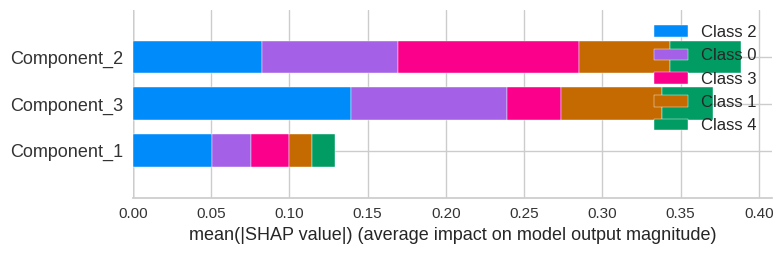

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [ ]:
interpret_model(tuned_et_pca, plot='summary')

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


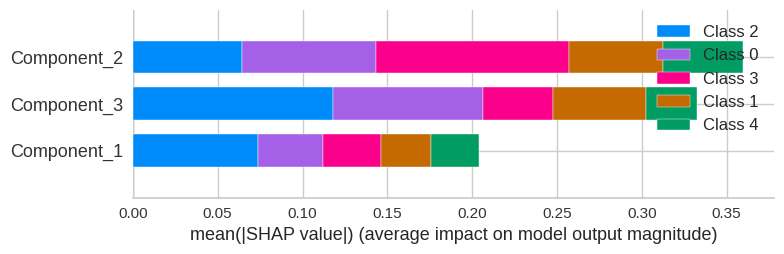

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [ ]:
interpret_model(tuned_rf_pca, plot='summary')

In [ ]:
#explainer = shap.TreeExplainer(tuned_rf_pca)
#X = df.drop('class', axis=1)
#shap_values = explainer.shap_values(X)
#shap.summary_plot(shap_values, X)

**Visualize a single prediction**

In [ ]:
interpret_model(tuned_et_pca, plot='reason', observation=32)

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features=1.0, max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0,
                     min_impurity_split=None, min_samples_leaf=4,
                     min_samples_split=7, min_weight_fraction_leaf=0.0,
                     n_estimators=200, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=32, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:model type detected: Unknown


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [ ]:
interpret_model(tuned_rf_pca, plot='reason', observation=32)

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=32, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:model type detected: Unknown


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


From the above the plot, we can seethe "base value," which is defined as the mean predicted target; and f(x), which is the prediction for a selected observation (i.e. observation number 32). The red-colored features increased the predicted value, while the blue-colored features decreased it. The size of each feature (i.e. Principal Component) indicates the impact it has on the model.

**Visualize many predictions**

In [ ]:
interpret_model(tuned_et_pca, plot='reason')

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0,
                     class_weight='balanced_subsample', criterion='gini',
                     max_depth=6, max_features=1.0, max_leaf_nodes=None,
                     max_samples=None, min_impurity_decrease=0,
                     min_impurity_split=None, min_samples_leaf=4,
                     min_samples_split=7, min_weight_fraction_leaf=0.0,
                     n_estimators=200, n_jobs=-1, oob_score=False,
                     random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [ ]:
interpret_model(tuned_rf_pca, plot='reason')

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,
                       n_estimators=260, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................
